# Udacity Self-Driving Car ND:  Advanced Lane finding Project
This note book contains the code required.

##  1. Camera Calibration
The implementation for camera calibrartion using calibration images of chess boards.

### Import needed Python modules


In [1]:
import numpy as np
import cv2
import glob
import matplotlib.pyplot as plt
import pickle
%matplotlib inline
%matplotlib qt

In [2]:
# Define global constants 
nx = 9
ny = 6
calib_image_path = "./camera_cal/calibration*.jpg"

In [3]:
#Define global variables for Calibration information
# prepare object points, like (0,0,0), (1,0,0), (2,0,0) ....,(6,5,0)
objp = np.zeros((ny * nx,3), np.float32)
objp[:,:2] = np.mgrid[0:nx, 0:ny].T.reshape(-1,2)

# Arrays to store object points and image points from all the images.
objpoints = [] # 3d points in real world space
imgpoints = [] # 2d points in image plane.

# Make a list of calibration images
images = glob.glob(calib_image_path)

In [4]:
# Step through the list and search for chessboard corners
for idx, fname in enumerate(images):
    img = cv2.imread(fname)
    gray = cv2.cvtColor(img, cv2.COLOR_BGR2GRAY)

    # Find the chessboard corners
    ret, corners = cv2.findChessboardCorners(gray, (nx, ny), None)

    # If found, add object points, image points
    if ret == True:
        objpoints.append(objp)
        imgpoints.append(corners)

        # Draw and display the corners
        cv2.drawChessboardCorners(img, (nx, ny), corners, ret)
        cv2.imshow('img', img)
        cv2.waitKey(500)
    else:
        print("Corners Not Detected on {}".format(fname))

cv2.destroyAllWindows()

Corners Not Detected on ./camera_cal\calibration1.jpg
Corners Not Detected on ./camera_cal\calibration4.jpg
Corners Not Detected on ./camera_cal\calibration5.jpg


In [5]:
print("Lengths: objpoints {}, imgpoints {}".format(len(objpoints), len(imgpoints)))

Lengths: objpoints 17, imgpoints 17


In [6]:
#Global variables testing the calibration
test_example_dir = './camera_cal/'
test_img_name = 'calibration16.jpg'
calib_result_path = './camera_cal/dist_pickle.p'

(1280, 720)
(3, 720)


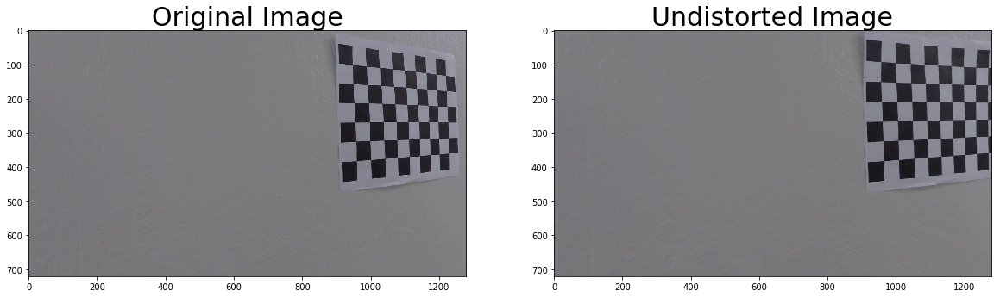

In [7]:
import pickle
%matplotlib inline

# Test undistortion on an image
filepath = test_example_dir + test_img_name
img = cv2.imread(filepath)
img_size = (img.shape[1], img.shape[0])
print(img_size)
print(img.shape[::-2])

# Do camera calibration given object points and image points
ret, mtx, dist, rvecs, tvecs = cv2.calibrateCamera(objpoints, imgpoints, img_size,None,None)

# Save the camera calibration result for later use (we won't worry about rvecs / tvecs)
dist_pickle = {}
dist_pickle["mtx"] = mtx
dist_pickle["dist"] = dist
pickle.dump( dist_pickle, open(calib_result_path, "wb" ) )

dst = cv2.undistort(img, mtx, dist, None, mtx)
undist_path = test_example_dir + 'undist_'+ test_img_name
cv2.imwrite(undist_path,dst)


# Visualize undistortion
img = cv2.cvtColor(img, cv2.COLOR_BGR2RGB)
dst = cv2.cvtColor(dst, cv2.COLOR_BGR2RGB)

f, (ax1, ax2) = plt.subplots(1, 2, figsize=(20,10))
ax1.imshow(img)
ax1.set_title('Original Image', fontsize=30)

ax2.imshow(dst)
ax2.set_title('Undistorted Image', fontsize=30)

plt.show()

In [8]:
fh = open(calib_result_path, "rb" )
dist_pickle = pickle.load(fh) 
mtx = dist_pickle["mtx"]
dist = dist_pickle["dist"]

In [9]:
def plot_image (img):
    shape = img.shape
    print(shape)
    if (len(shape) < 3):
        plt.imshow(img, cmap = 'gray')
    else:
        plt.imshow(img)
    plt.show()
    
# Plot the result
def plot2imgs (image, i_title, gray, g_title):
    
    f, (ax1, ax2) = plt.subplots(1, 2, figsize=(24, 9))
    f.tight_layout()
    ax1.imshow(image)
    ax1.set_title(i_title, fontsize=50)

    ax2.imshow(gray, cmap='gray')
    ax2.set_title(g_title, fontsize=50)
    plt.subplots_adjust(left=0., right=1, top=0.9, bottom=0.)
    plt.show()
    

(1280, 720)
(3, 720)


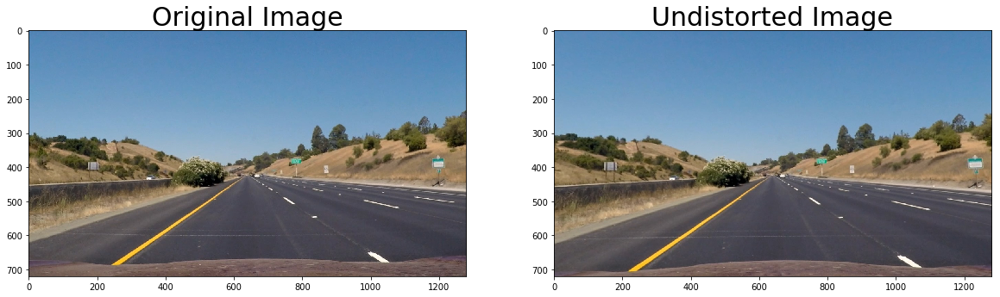

In [10]:
img = cv2.imread('./test_images/straight_lines1.jpg')
img_size = (img.shape[1], img.shape[0])
print(img_size)
print(img.shape[::-2])


dst = cv2.undistort(img, mtx, dist, None, mtx)
undist_path = test_example_dir + 'undist_'+ test_img_name
cv2.imwrite(undist_path,dst)


# Visualize undistortion
img = cv2.cvtColor(img, cv2.COLOR_BGR2RGB)
dst = cv2.cvtColor(dst, cv2.COLOR_BGR2RGB)

f, (ax1, ax2) = plt.subplots(1, 2, figsize=(20,10))
ax1.imshow(img)
ax1.set_title('Original Image', fontsize=30)

ax2.imshow(dst)
ax2.set_title('Undistorted Image', fontsize=30)

plt.show()

## Thresholding
This section implements needed thresholding functions.

In [11]:
# Define a function that applies Sobel x or y, 
# then takes an absolute value and applies a threshold.
# Note: calling your function with orient='x', thresh_min=5, thresh_max=100
# should produce output like the example image shown above this quiz.

def abs_sobel_thresh(img, orient='x', sobel_kernel = 3, thresh = (0, 255)):
    #img input is always in RGB
    
    # Apply the following steps to img
    # 1) Convert to grayscale
    gray = cv2.cvtColor(img, cv2.COLOR_RGB2GRAY)  #read from mpimg
    
    # 2) Take the derivative in x or y given orient = 'x' or 'y'
    if (orient == 'x'):
        sobel = cv2.Sobel(gray, cv2.CV_64F, 1, 0, ksize = sobel_kernel)
    else:
        sobel = cv2.Sobel(gray, cv2.CV_64F, 0, 1, ksize = sobel_kernel )        
    
    # 3) Take the absolute value of the derivative or gradient
    abs_sobel = np.absolute(sobel)
    
    # 4) Scale to 8-bit (0 - 255) then convert to type = nksize = sobel_kernel p.uint8
    scaled_sobel = np.uint8(255*abs_sobel/np.max(abs_sobel))
    
    # 5) Create a mask of 1's where the scaled gradient magnitude 
            # is > thresh_min and < thresh_max

    sbinary = np.zeros_like(scaled_sobel)
    sbinary[(scaled_sobel >= thresh [0]) & (scaled_sobel <= thresh [1])] = 1
 
    # 6) Return this mask as your binary_output image
    return sbinary



# Define a function that applies Sobel x and y, 
# then computes the magnitude of the gradient
# and applies a threshold
def mag_thresh(img, sobel_kernel=3, mag_thresh=(0, 255)):
    #input image assumed in RGB format
    
    # Apply the following steps to img
    
    # 1) Convert to grayscale
    gray = cv2.cvtColor(img, cv2.COLOR_RGB2GRAY)

    # 2) Take the gradient in x and y separately
    sobelx = cv2.Sobel(gray, cv2.CV_64F, 1, 0, sobel_kernel)
    sobely = cv2.Sobel(gray, cv2.CV_64F, 0, 1, sobel_kernel)
    
    # 3) Calculate the magnitude 
    magnitude = np.sqrt(sobelx**2 + sobely**2)
    
    # 4) Scale to 8-bit (0 - 255) and convert to type = np.uint8
    scaled_magnitude = np.uint8(255*magnitude/np.max(magnitude))
                             
    # 5) Create a binary mask where mag thresholds are met
    sbinary = np.zeros_like(scaled_magnitude)

    sbinary[(scaled_magnitude >= mag_thresh [0]) & (scaled_magnitude <= mag_thresh [1])] = 1
    binary_output = np.copy(sbinary)
                        
    # 6) Return this mask as your binary_output image
    return binary_output


# Define a function that applies Sobel x and y, 
# then computes the direction of the gradient
# and applies a threshold.
def dir_threshold(img, sobel_kernel=3, thresh=(0, np.pi/2)):
    # image input is always in RGB format
    
    # Apply the following steps to img

    # 1) Convert to grayscale
    gray = cv2.cvtColor(img, cv2.COLOR_RGB2GRAY)
    
    # 2) Take the gradient in x and y separately
    sobelx = cv2.Sobel(gray, cv2.CV_64F, 1, 0, ksize = sobel_kernel)
    sobely = cv2.Sobel(gray, cv2.CV_64F, 0, 1, ksize = sobel_kernel)

    # 3) Take the absolute value of the x and y gradients
    abs_sobelx, abs_sobely = np.absolute(sobelx), np.absolute(sobely)
    
    # 4) Use np.arctan2(abs_sobely, abs_sobelx) to calculate the direction of the gradient 
    dir_gradient = np.arctan2(abs_sobely, abs_sobelx)
    #dir_gradient = np.absolute(dir_gradient)
    
    # 5) Create a binary mask where direction thresholds are met
    binary_output = np.zeros_like(dir_gradient)
    binary_output[(dir_gradient > thresh[0]) & (dir_gradient < thresh[1])] = 1
    
    # 6) Return this mask as your binary_output image
    return binary_output
    
def region_of_interest(img, vertices):
    """
    Applies an image mask.
    
    Only keeps the region of the image defined by the polygon
    formed from `vertices`. The rest of the image is set to black.
    """
    #defining a blank mask to start with
    mask = np.zeros_like(img)   
    
    #defining a 3 channel or 1 channel color to fill the mask with depending on the input image
    if len(img.shape) > 2:
        channel_count = img.shape[2]  # i.e. 3 or 4 depending on your image
        ignore_mask_color = (255,) * channel_count
    else:
        ignore_mask_color = 255
        
    #filling pixels inside the polygon defined by "vertices" with the fill color    
    cv2.fillPoly(mask, vertices, ignore_mask_color)
    
    #returning the image only where mask pixels are nonzero
    masked_image = cv2.bitwise_and(img, mask)
    return masked_image



In [12]:
#Experiment with different gray thresholds
# Choose a Sobel kernel size
ksize = 3 # Choose a larger odd number to smooth gradient measurements

image = cv2.imread("./test_images/straight_lines1.jpg")
image = cv2.cvtColor(image, cv2.COLOR_BGR2RGB)


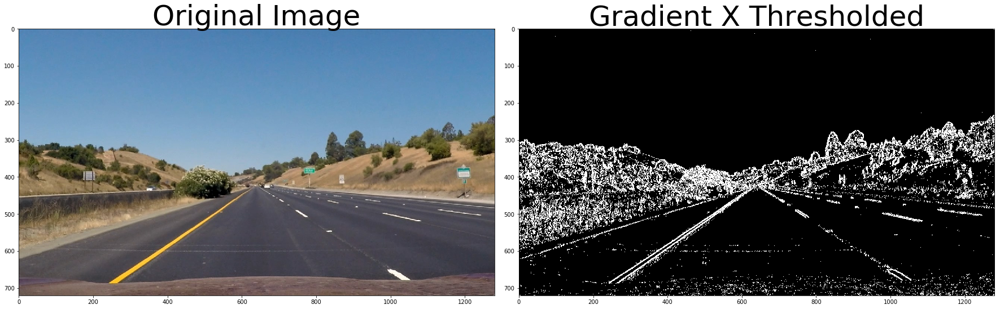

In [13]:
# Apply each of the thresholding functions
gradx = abs_sobel_thresh(image, orient='x', sobel_kernel=ksize, thresh=(10, 220))

# Plot the result
plot2imgs (image, 'Original Image', gradx, 'Gradient X Thresholded')

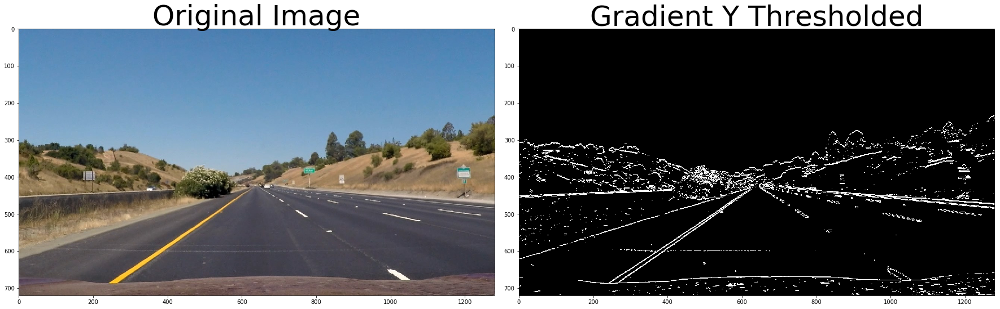

In [14]:
# Apply each of the thresholding functions

grady = abs_sobel_thresh(image, orient='y', sobel_kernel=ksize, thresh=(30, 150))
# Plot the result
# Plot the result
plot2imgs (image, 'Original Image', grady, 'Gradient Y Thresholded')

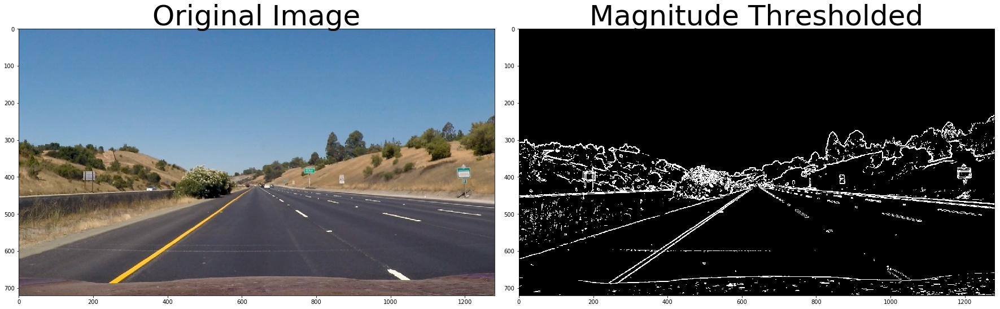

In [15]:
mag_binary = mag_thresh(image, sobel_kernel=ksize, mag_thresh=(30, 150))

# Plot the result
plot2imgs (image, 'Original Image', mag_binary, 'Magnitude Thresholded')

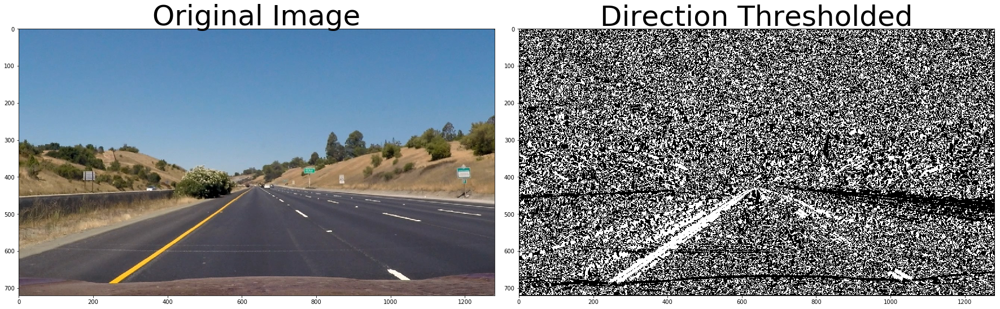

In [16]:

dir_binary = dir_threshold(image, sobel_kernel=15, thresh=(0.7, 1.3))

# Plot the result
plot2imgs (image, 'Original Image', dir_binary, 'Direction Thresholded')

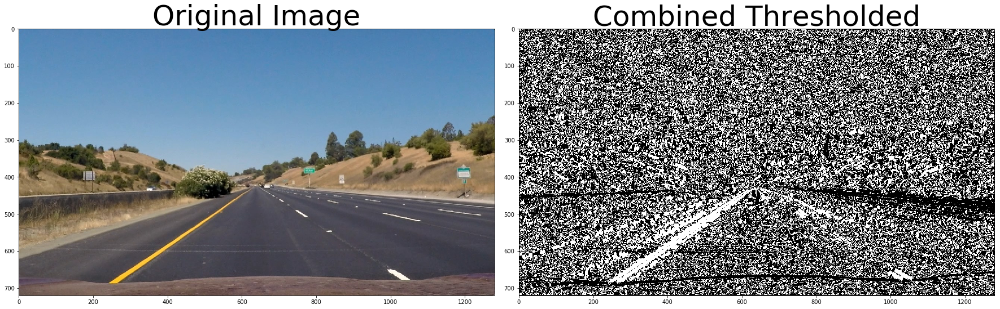

In [17]:

combined = np.zeros_like(dir_binary)
combined[(gradx == 1)  & (dir_binary == 1)] = 1

# Plot the result
plot2imgs (image, 'Original Image', dir_binary, 'Combined Thresholded')

In [18]:
def combo_threshold (image):
    ksize = 3
    clr_thresh = (110, 255)
    dir_thresh = (0.7, 1.3)
    s_thresh = (110, 255)
    l_thresh = (110, 255)
    dir_ksize = 15
    
    image_size = (image.shape[1], image.shape[0])
    #get combined threshold
    gradx = abs_sobel_thresh(image, orient='x', sobel_kernel=ksize, thresh=(10, 200))
    grady = abs_sobel_thresh(image, orient='y', sobel_kernel=ksize, thresh=(10, 200))
    mag_binary = mag_thresh(image, sobel_kernel=ksize, mag_thresh=(10, 200))
    dir_binary = dir_threshold(image, sobel_kernel=dir_ksize, thresh=dir_thresh)
    combined = np.zeros_like(dir_binary)
    combined[((gradx == 1) & (grady == 1)) | ((mag_binary == 1) & (dir_binary == 1))] = 1
    
    
    #Get R & G information
    R = image [:,:,0]
    G = image [:,:,1]
    B = image [:,:,2]
    
    #R & G channels contain Yellow and white line information.
    r_binary = np.zeros_like(R)
    r_binary[(R > clr_thresh[0]) & (R <= clr_thresh[1])] = 1
    
    g_binary = np.zeros_like(G)
    g_binary[(G > clr_thresh[0]) & (G <= clr_thresh[1])] = 1
    
    rg_binary = np.zeros_like (g_binary)
    rg_binary [(r_binary > 0) & (g_binary > 0)] = 1
    
    #Extract HSL color spaces
    hsl = cv2.cvtColor(image, cv2.COLOR_RGB2HLS)
    S = hsl [:, :, 1]
    L = hsl [:, :, 2]
    
    s_binary = np.zeros_like(S)
    s_binary[(S >= s_thresh[0]) & (S <= s_thresh[1])] = 1
    
    l_binary = np.zeros_like(L)
    l_binary[(L >= l_thresh[0]) & (L <= l_thresh[1])] = 1
    
    combo_binary = np.zeros_like(combined)
    #combo_binary [((rg_binary == 1) & (l_binary == 1)) & ((s_binary ==1) | (combined ==1))] = 1
    combo_binary [ ((s_binary & l_binary) > 0) | (combined > 1)] = 1
    
    #get the bounding box for area of interest
    bottom_lx = 0.14 * image_size [0]
    bottom_ly = 0.98 * image_size [1]
    bottom_rx = 0.94 * image_size [0] 
    bottom_ry = 0.98 * image_size [1]
    
    top_lx    = 0.45 * image_size [0]  
    top_ly    = 0.55 * image_size [1]
    top_rx    = 0.55 * image_size [0]  
    top_ry    = 0.55 * image_size [1]
    
    vertices = np.array([[(bottom_lx, bottom_ly), (top_lx, top_ly), (top_rx, top_ry),(bottom_rx, bottom_ry)]], dtype=np.int32)
    print (vertices)
    masked_edges = region_of_interest(combo_binary, vertices)

    
    return masked_edges

[[[ 179  705]
  [ 576  396]
  [ 704  396]
  [1203  705]]]


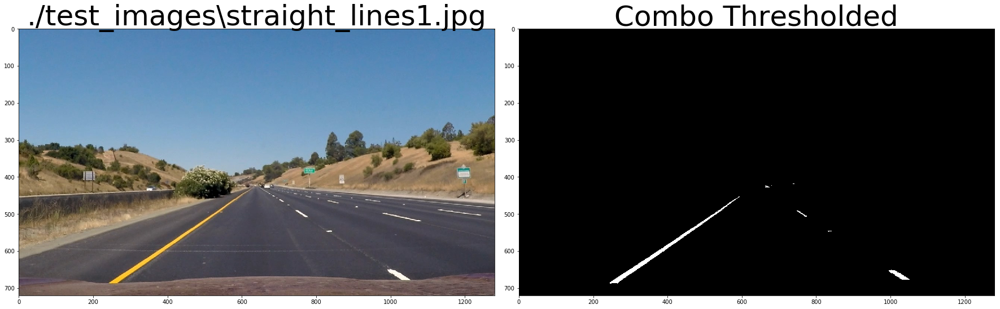

[[[ 179  705]
  [ 576  396]
  [ 704  396]
  [1203  705]]]


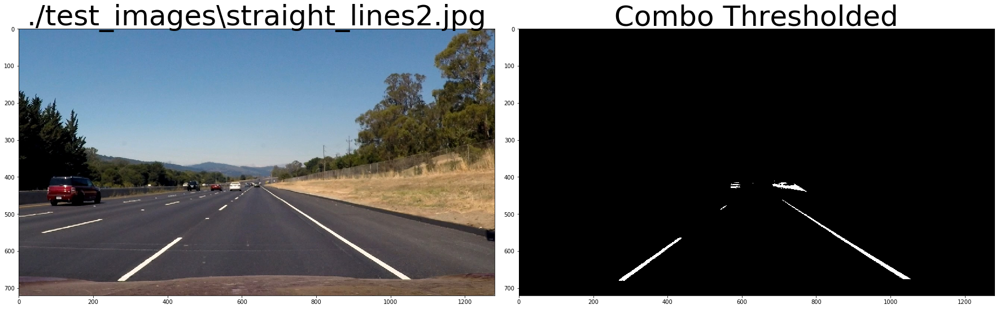

[[[ 179  705]
  [ 576  396]
  [ 704  396]
  [1203  705]]]


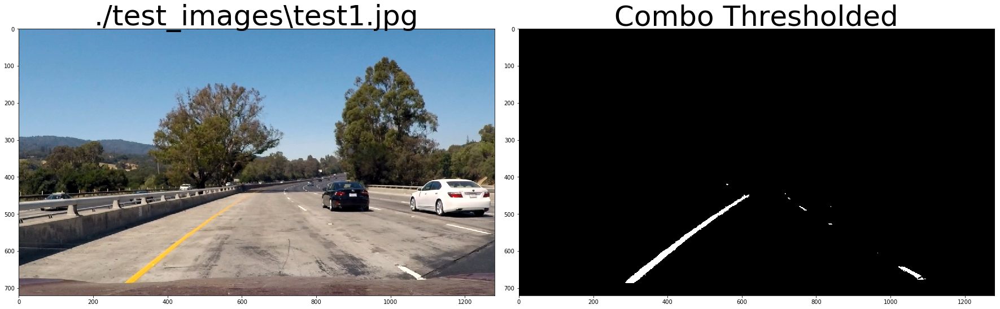

[[[ 179  705]
  [ 576  396]
  [ 704  396]
  [1203  705]]]


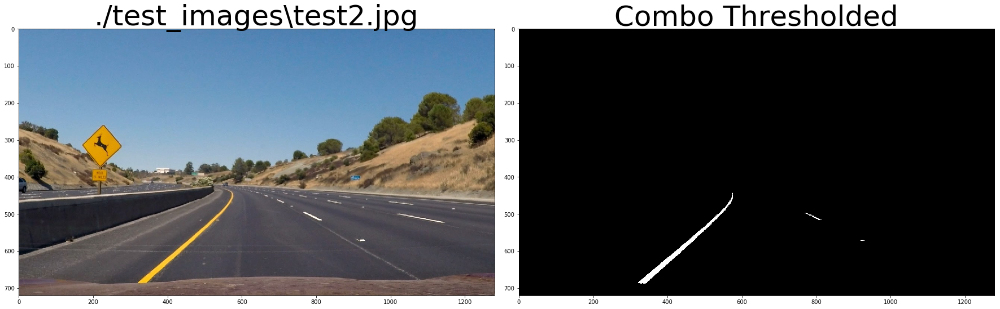

[[[ 179  705]
  [ 576  396]
  [ 704  396]
  [1203  705]]]


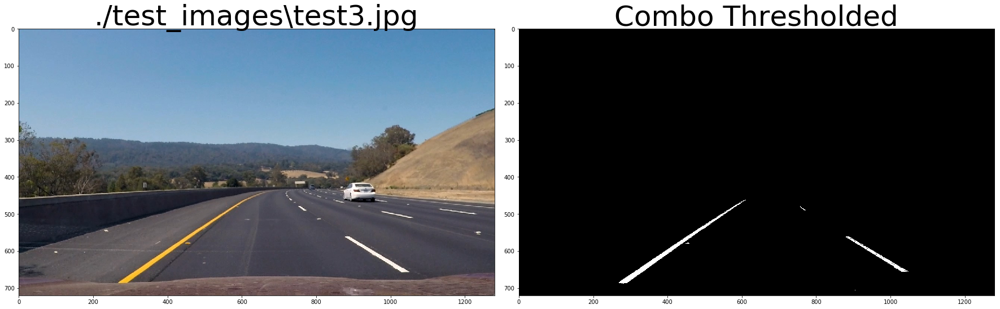

[[[ 179  705]
  [ 576  396]
  [ 704  396]
  [1203  705]]]


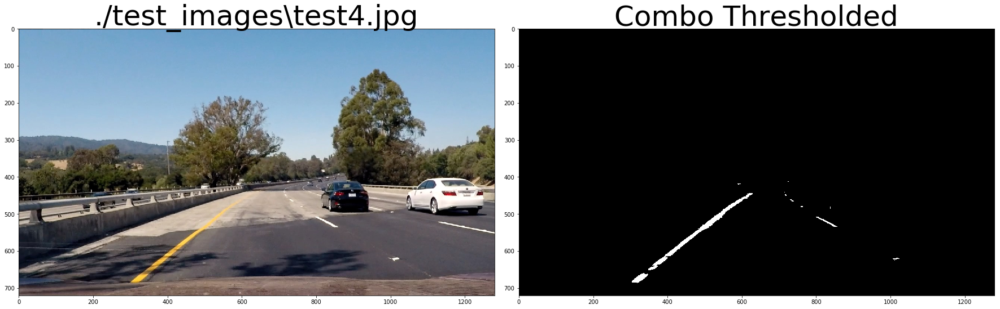

[[[ 179  705]
  [ 576  396]
  [ 704  396]
  [1203  705]]]


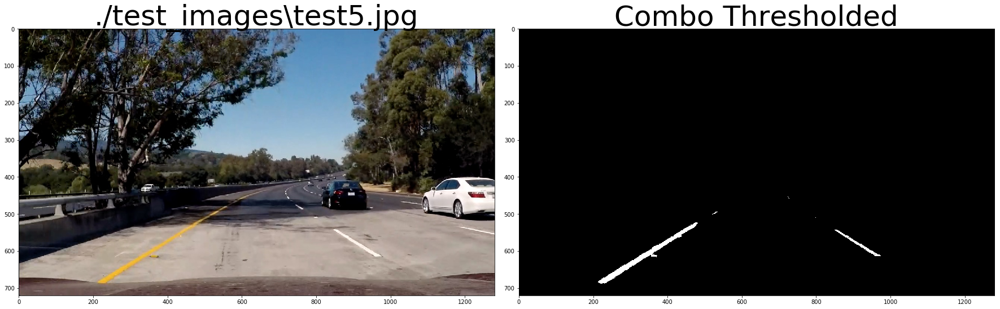

[[[ 179  705]
  [ 576  396]
  [ 704  396]
  [1203  705]]]


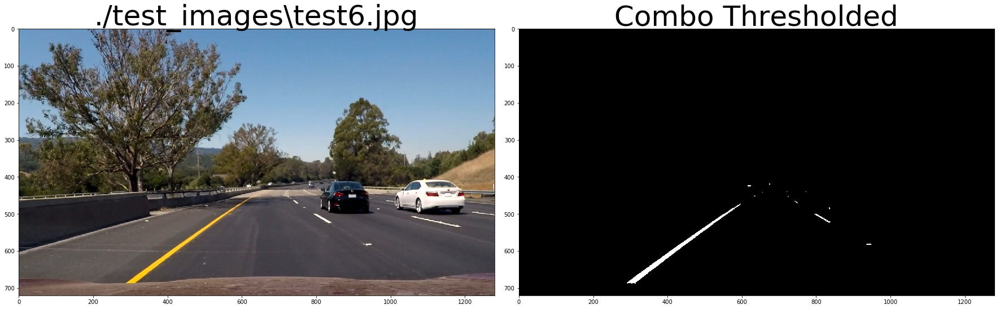

In [19]:
# Make a list of test images
test_images = glob.glob('./test_images/*.jpg')
for idx, fname in enumerate(test_images):
    img = cv2.imread(fname)
    img = cv2.cvtColor(img, cv2.COLOR_BGR2RGB)
    combo_binary = combo_threshold (img)

    # Plot the result
    plot2imgs (img, fname, combo_binary, 'Combo Thresholded')